# Examine CMIP6 gridded climate data on s3
CMIP6 projections of future climate variables are produced from a number of institutions using a variety of models. There is a lot of variation among these gridded results, so a good way to work with 'CMIP6' data is to build ensemble grids at each time step. This requires [1] access to a lot of data and [2] manipulation with `xarray` to read and reduce the data.

Understanding the metadata can be a challenge: https://cmor.llnl.gov/mydoc_cmor3_CV/

### Access and manipulation of CMIP6 grids to build ensemble maps for an extent.

Paul Montesano, PhD  
June 2024

**Goal:**  
Learn how to access and work with CMIP6 gridded data from all institutions

**Motivation:**    
Use of CMIP6 grids as input into future predictions probably warrants an ensemble approach for any given area of interest.  

To use the data in the way you need to:  
1. access the data in s3  
2. query to find the data you want  
3. iterate over query results to map/plot/crop/stack  
4. Reduce the xarray stack to a final ensemble result for a given variable / time range / extent  

**Resources:**  

we should probably used aleady-prepared grids for this (ala those from worldclim 2.1): https://geodata.ucdavis.edu/cmip6/30s . These are "downscaled and calibrated" CMIP6 grids at 30sec res

**Other CMIP6 grid processing resources:**  
https://github.com/jbusecke/xMIP/blob/HEAD/docs/tutorial.ipynb  
https://gallery.pangeo.io/repos/pangeo-gallery/cmip6/basic_search_and_load.html  
https://aims2.llnl.gov/search/cmip6  
https://registry.opendata.aws/cmip6/

https://pangeo-data.github.io/pangeo-cmip6-cloud/accessing_data.html  
https://community-doc.s3.us-east-2.amazonaws.com/CMIP6_AWS_cloud_data_info_session.pdf  
https://ecmwf-projects.github.io/copernicus-training-c3s/projections-cmip6.html  
CMIP6 variables: https://pcmdi.llnl.gov/mips/cmip3/variableList.html#Highest_priority_output

https://claut.gitlab.io/man_ccia/lab2.html#earth-system-grid-federation

In [50]:
# This works to install packages in CoLab notebook: 
# https://colab.research.google.com/drive/1lGfN44H9ov6sPDfFYL05s7sySuituoCz#scrollTo=M16tx12Ka6Yu
#!conda install xarray-datatree intake-esm gcsfs xmip aiohttp nc-time-axis cf_xarray xarrayutils &> /dev/null

In [1]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

import cartopy.crs as ccrs

import s3fs
import xarray as xr

# Connect to AWS S3 storage
s3 = s3fs.S3FileSystem(anon=True)

import zarr
import fsspec

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams['figure.figsize'] = 12, 6

### Access: read the CMIP6 metadata from pangeo on s3

In [2]:
metadata_url = "https://cmip6-pds.s3.amazonaws.com/pangeo-cmip6.csv"

In [3]:
#cmip6_metadata_df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
cmip6_metadata_df = pd.read_csv(metadata_url)
cmip6_metadata_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 522217 entries, 0 to 522216
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   activity_id     522217 non-null  object 
 1   institution_id  522217 non-null  object 
 2   source_id       522217 non-null  object 
 3   experiment_id   522217 non-null  object 
 4   member_id       522217 non-null  object 
 5   table_id        522217 non-null  object 
 6   variable_id     522217 non-null  object 
 7   grid_label      522217 non-null  object 
 8   zstore          522217 non-null  object 
 9   dcpp_init_year  141466 non-null  float64
 10  version         522217 non-null  int64  
dtypes: float64(1), int64(1), object(9)
memory usage: 43.8+ MB


### Query the s3 database of CMIP6 Earth System Models
We will want to create and ensemble across any GCM like the single one below with a query like this:  

**This is what we have been using for SIBBORK - its a single, fairly arbitrary CMIP6 grid**

```python
query_dict = dict(
             institution_id='CNRM-CERFACS',
             source_id='CNRM-CM6-1-HR',
             experiment_id='ssp585', 
             table_id='Amon',
             variable_id='tas',
             member_id = 'r1i1p1f2',
             grid_label='gr'
                 )
```
**The Nature Comms Earth & Env paper used WorldClim-processed grids - which were easy to ensemble:**  
https://geodata.ucdavis.edu/cmip6/30s (there is actually more than what were available at 30 s)


```python
query_dict = dict(
             experiment_id='ssp585', 
             table_id='Amon',
             variable_id='tas',
             grid_label='gr'
                 )
```

In [4]:
# Exclude models not used in WorldClim 30s data agg
# https://geodata.ucdavis.edu/cmip6/30s/
source_id_exclude_list=['CAMS-CSM1-0', 'CAS-ESM2-0', 'CESM2', 'CESM2-WACCM', 
                        'CIESM','CMCC-CM2-SR5','E3SM-1-1',
                        'EC-Earth3', 'EC-Earth3-CC', 'GFDL-CM4',
                        'FGOALS-f3-L', 'FGOALS-g3','IITM-ESM',
                        'KACE-1-0-G', 'KIOST-ESM', 'MCM-UA-1-0',
                        'NESM3', 'NorESM2-LM', 'NorESM2-MM', 'TaiESM1']

In [5]:
query_dict_equal = dict(
             #institution_id='CNRM-CERFACS',
             #source_id='GISS-E2-1-G',
             #experiment_id='ssp585', 
            experiment_id='ssp245',
             table_id='Amon',
             variable_id='tas',
             #member_id = 'r1i1p1f2',
             #grid_label='gr'
                 )
query_dict_notequal = dict(
             member_id = 'r1i1p1f1',
                 )

In [6]:
query_equal = ' & '.join(["{} == '{}'".format(k,v) for k,v in query_dict_equal.items()])   
#query_notequal = ' and '.join(["{} != '{}'".format(k,v) for k,v in query_dict_notequal.items()])    
query_source_id_exclude = ' & '.join(["source_id != '{}'".format(s) for s in source_id_exclude_list])
subset_df = cmip6_metadata_df.query(query_equal).query(query_source_id_exclude)#.query(query_notequal)
print(subset_df.shape)

(280, 11)


In [7]:
print(sorted(subset_df.source_id.unique()))
len(subset_df.source_id.unique())

['ACCESS-CM2', 'ACCESS-ESM1-5', 'AWI-CM-1-1-MR', 'BCC-CSM2-MR', 'CMCC-ESM2', 'CNRM-CM6-1', 'CNRM-CM6-1-HR', 'CNRM-ESM2-1', 'CanESM5', 'CanESM5-CanOE', 'EC-Earth3-Veg', 'EC-Earth3-Veg-LR', 'FIO-ESM-2-0', 'GFDL-ESM4', 'GISS-E2-1-G', 'GISS-E2-1-H', 'HadGEM3-GC31-LL', 'INM-CM4-8', 'INM-CM5-0', 'IPSL-CM6A-LR', 'MIROC-ES2L', 'MIROC6', 'MPI-ESM1-2-HR', 'MPI-ESM1-2-LR', 'MRI-ESM2-0', 'UKESM1-0-LL']


26

In [8]:
subset_df.zstore.values[0:4]

array(['s3://cmip6-pds/CMIP6/ScenarioMIP/NOAA-GFDL/GFDL-ESM4/ssp245/r1i1p1f1/Amon/tas/gr1/v20180701/',
       's3://cmip6-pds/CMIP6/ScenarioMIP/NOAA-GFDL/GFDL-ESM4/ssp245/r2i1p1f1/Amon/tas/gr1/v20180701/',
       's3://cmip6-pds/CMIP6/ScenarioMIP/NOAA-GFDL/GFDL-ESM4/ssp245/r3i1p1f1/Amon/tas/gr1/v20180701/',
       's3://cmip6-pds/CMIP6/ScenarioMIP/IPSL/IPSL-CM6A-LR/ssp245/r1i1p1f1/Amon/tas/gr/v20190119/'],
      dtype=object)

### Build a list of datasets by iterating over list returned from query

**Use pre-processing from `XMIP`**
Try to use existing code to preprocess
https://github.com/jbusecke/xMIP/blob/aff665950556abc1bdbae521c308a86f9ef8899a/docs/tutorial.ipynb

Much of the XMIP pre-processing is based on the inital creation of a specific data dictionary done with `intake`. The dictionary is nice b/c it keeps the CMIP6 metadata with the gridded datasets themselves.  Not essential though. Below is how I was able to get the reads and preprocessing to work.


I never got this working on MAAP  
ToDo: cant get `intake.open_esm_datastore` working:  
https://gallery.pangeo.io/repos/pangeo-gallery/cmip6/intake_ESM_example.html
https://pangeo-data.github.io/pangeo-cmip6-cloud/accessing_data.html  
Possible solution?:  `intake_esm.esm_datastore()`

In [614]:
pip install nc-time-axis

Note: you may need to restart the kernel to use updated packages.


In [13]:
pip install xmip

  Using cached xmip-0.7.2-py3-none-any.whl.metadata (5.2 kB)
  Using cached xgcm-0.6.1-py3-none-any.whl.metadata (6.0 kB)
  Using cached Pint-0.24-py3-none-any.whl.metadata (8.5 kB)
  Using cached pint_xarray-0.3-py3-none-any.whl.metadata (3.1 kB)
  Using cached future-1.0.0-py3-none-any.whl.metadata (4.0 kB)
  Using cached flexcache-0.3-py3-none-any.whl.metadata (7.0 kB)
  Using cached flexparser-0.3.1-py3-none-any.whl.metadata (18 kB)
Using cached xmip-0.7.2-py3-none-any.whl (58 kB)
Using cached xgcm-0.6.1-py3-none-any.whl (60 kB)
Using cached Pint-0.24-py3-none-any.whl (300 kB)
Using cached pint_xarray-0.3-py3-none-any.whl (32 kB)
Using cached flexcache-0.3-py3-none-any.whl (13 kB)
Using cached flexparser-0.3.1-py3-none-any.whl (27 kB)
Using cached future-1.0.0-py3-none-any.whl (491 kB)
Note: you may need to restart the kernel to use updated packages.


In [16]:
import nc_time_axis
import xmip
from xmip.preprocessing import *

In [10]:
# import sys
# sys.path.append('/projects/code/maap_tools/notebooks')
# import xmip_preprocessing

In [17]:
def xmip_preprocess_wrapper(ds):
    ds = ds.copy()
    ds = rename_cmip6(ds)
    ds = promote_empty_dims(ds)
    ds = broadcast_lonlat(ds)
    ds = replace_x_y_nominal_lat_lon(ds)
    return ds

In [18]:
def subset_cmip6_ds(ds, EXTENT = (190, 230, 55, 75)):
    
    # [1] Do we just use this? , but is the ds thats opened the same?
    #     https://github.com/jbusecke/xMIP/blob/HEAD/docs/tutorial.ipynb
    # [2] Looks like ensemble grids were made here? but where is the data?
    #     https://climate-scenarios.canada.ca/?page=cmip6-technical-notes#table-2
    
    # Basic first attempt
    min_lon, max_lon, min_lat, max_lat = EXTENT
    subset_ds = ds.sel(y=slice(min_lat,max_lat), x=slice(min_lon,max_lon))#.tas#.sel({'time':'2016-01'})
    
    return subset_ds
    
def process_cmip6_ds(zarr_dir_path):

    # create a mutable-mapping-style interface to the store
    mapper = s3.get_mapper(zarr_dir_path)
    
    zarr_kwargs = {
        "consolidated": True,
        # "decode_times": False,
        #"decode_times": False,
        #"use_cftime": False,
    }

    # [1] Open it using xarray and zarr
    # https://docs.xarray.dev/en/stable/generated/xarray.Dataset.convert_calendar.html
    ds = xr.open_zarr(mapper, **zarr_kwargs).convert_calendar("standard", align_on='date', use_cftime=True) #using 'align_on' = date or year will make this work, but the time-series line plots are interrupted...
    # [2] Pre-process
    ds = xmip_preprocess_wrapper(ds)
    # [3] Subset to extent
    ds = subset_cmip6_ds(ds)
   
    return ds

## Read and pre-process to build list of subsets
Pre-processing seems to fix some time inconcsitencies, among other things. The geographic subsetting is very helpful for reducing file size.

In [19]:
%%time

cmip6_ds_list = [process_cmip6_ds(zarr_dir_path) for zarr_dir_path in subset_df.zstore.values]
len(cmip6_ds_list)

CPU times: user 24 s, sys: 894 ms, total: 24.9 s
Wall time: 1min 43s


280

In [20]:
ds = cmip6_ds_list[0]
ds

<xarray.Dataset>
Dimensions:      (time: 1032, y: 20, x: 32, bnds: 2)
Coordinates:
    height       float64 2.0
  * time         (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
  * bnds         (bnds) int64 0 1
    lon          (x, y) float64 190.6 190.6 190.6 190.6 ... 229.4 229.4 229.4
    lat          (x, y) float64 55.5 56.5 57.5 58.5 59.5 ... 71.5 72.5 73.5 74.5
  * x            (x) float64 190.6 191.9 193.1 194.4 ... 225.6 226.9 228.1 229.4
  * y            (y) float64 55.5 56.5 57.5 58.5 59.5 ... 71.5 72.5 73.5 74.5
Data variables:
    tas          (time, y, x) float32 dask.array<chunksize=(862, 20, 32), meta=np.ndarray>
    lon_bounds   (x, bnds) float64 dask.array<chunksize=(32, 2), meta=np.ndarray>
    time_bounds  (time, bnds) object dask.array<chunksize=(1032, 2), meta=np.ndarray>
    lat_bounds   (y, bnds) float64 dask.array<chunksize=(20, 2), meta=np.ndarray>
Attributes: (12/49)
    Conventions:            CF-1.7 CMIP-6.0 UGRID-1.0
    activity_id:            ScenarioMIP
    branch_method:          standard
    branch_time_in_child:   60225.0
    branch_time_in_parent:  60225.0
    comment:                <null ref>
    ...                     ...
    variable_id:            tas
    variant_info:           N/A
    variant_label:          r1i1p1f1
    status:                 2019-10-25;created;by nhn2@columbia.edu
    netcdf_tracking_ids:    hdl:21.14100/193372a3-8233-4262-a351-9dfe0b568c21
    version_id:             v20180701

## Build an ensemble of CMIP6 grids for subset

**Resources:**  
https://climate-scenarios.canada.ca/?page=cmip6-technical-notes  
https://www.nature.com/articles/s41597-023-02855-z

#### Ensemble median of **Near-Surface Air Temperature (monthly)** `TAS` 

Re-grid TAS to a common grid using interpolation  
 - use the first grid in the list as the grid to which other datasets will be regridded


**ToDo**
below i want to make sure to keep the metadata in `subset_df` associated with whatever list of datasets that I build.  

the XMIP tutorials use fancy dictionaries to keep that info with the datasets - but I cannot load the libraries that let me work with the data in those ways....

In [23]:
cmip6_dsinterp_list = []
for ds in cmip6_ds_list:
    cmip6_dsinterp_list.append(ds.drop_vars(['time_bounds'], errors='ignore').interp(y=cmip6_ds_list[0]["y"], x=cmip6_ds_list[0]["x"]))
len(cmip6_dsinterp_list)

280

### Stacking

**WARNING!** here, the attributes that are carried through are those from the first dataset in the list - do something to carry attributes through for EACH item in list  
**WARNING!** concat over large list of models will probably fail - lots of inconsistencies among data



In [25]:
ds_combine = xr.concat(cmip6_dsinterp_list, dim='source_id', coords='minimal',compat='override')
ds_combine

<xarray.Dataset>
Dimensions:     (time: 6553, bnds: 2, y: 20, x: 32, source_id: 280)
Coordinates:
  * time        (time) object 2014-01-16 12:00:00 ... 2500-12-16 12:00:00
  * bnds        (bnds) int64 0 1
  * y           (y) float64 55.5 56.5 57.5 58.5 59.5 ... 71.5 72.5 73.5 74.5
  * x           (x) float64 190.6 191.9 193.1 194.4 ... 225.6 226.9 228.1 229.4
    height      float64 2.0
    lon         (x, y) float64 190.6 190.6 190.6 190.6 ... 229.4 229.4 229.4
    lat         (x, y) float64 55.5 56.5 57.5 58.5 59.5 ... 71.5 72.5 73.5 74.5
Dimensions without coordinates: source_id
Data variables:
    tas         (source_id, time, y, x) float32 dask.array<chunksize=(1, 74, 20, 32), meta=np.ndarray>
    lon_bounds  (source_id, x, bnds) float64 dask.array<chunksize=(1, 32, 2), meta=np.ndarray>
    lat_bounds  (source_id, y, bnds) float64 dask.array<chunksize=(1, 20, 2), meta=np.ndarray>
Attributes: (12/49)
    Conventions:            CF-1.7 CMIP-6.0 UGRID-1.0
    activity_id:            ScenarioMIP
    branch_method:          standard
    branch_time_in_child:   60225.0
    branch_time_in_parent:  60225.0
    comment:                <null ref>
    ...                     ...
    variable_id:            tas
    variant_info:           N/A
    variant_label:          r1i1p1f1
    status:                 2019-10-25;created;by nhn2@columbia.edu
    netcdf_tracking_ids:    hdl:21.14100/193372a3-8233-4262-a351-9dfe0b568c21
    version_id:             v20180701

### Point-specific time-series for each model (line plots)

`questions`:
1. why are all the lines not appearing?
2. why are some interrupted?

**ToDo:** 
1. want ds attributes available to use them to identify and group these model results - 

In [ ]:
FOCAL_LAT, FOCAL_LON = ()

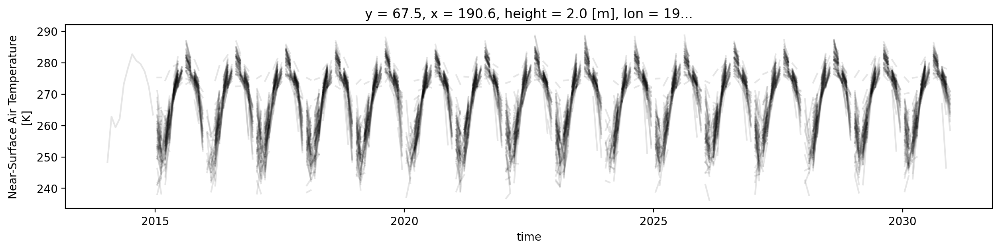

/opt/conda/envs/pangeo/lib/python3.10/site-packages/dask/utils.py:73: RuntimeWarning: All-NaN slice encountered
  return func(*args, **kwargs)
/opt/conda/envs/pangeo/lib/python3.10/site-packages/dask/utils.py:73: RuntimeWarning: All-NaN slice encountered
  return func(*args, **kwargs)
/opt/conda/envs/pangeo/lib/python3.10/site-packages/dask/array/reductions.py:616: RuntimeWarning: All-NaN slice encountered
  return np.nanmin(x_chunk, axis=axis, keepdims=keepdims)
/opt/conda/envs/pangeo/lib/python3.10/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/opt/conda/envs/pangeo/lib/python3.10/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/opt/conda/envs/pangeo/lib/python3.10/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/opt/conda/envs/pangeo/lib/python3.10/si

In [26]:
# Line plot of all models (bands) for a single lat lon
z = ds_combine.tas.sel(y=67.3, x=180-160.6, method='nearest').sel(time=slice('2010','2030')).plot.line( x="time", add_legend=False, figsize=(15,3), color='black', alpha=0.1)

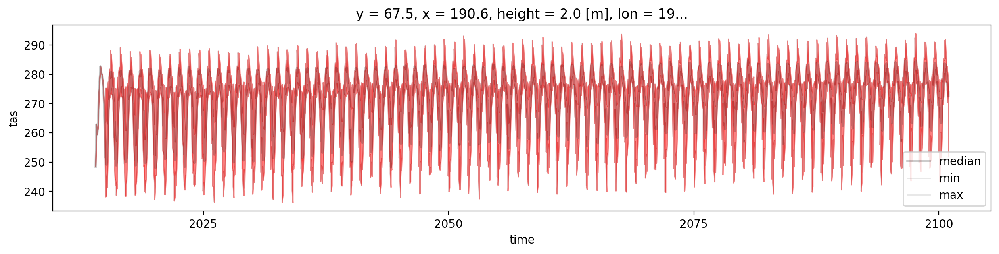

In [30]:
fig, ax = plt.subplots(1, 1, figsize=(15,3))

t1, t2 = ('2010','2100')

# Add min,max,median
ds_combine.tas.sel(y=67.3, x=180-160.6, method='nearest').median(dim="source_id").sel(time=slice(t1,t2)).plot.line(ax=ax, x="time", add_legend=True, label='median', color='black',linewidth=2, alpha=0.2)

ds_upr = ds_combine.tas.sel(y=67.3, x=180-160.6, method='nearest').min(dim="source_id").sel(time=slice(t1,t2))
ds_upr.plot.line(ax=ax, x="time", add_legend=True, label='min', color='gray',linewidth=1, alpha=0.2)

ds_lwr = ds_combine.tas.sel(y=67.3, x=180-160.6, method='nearest').max(dim="source_id").sel(time=slice(t1,t2))
ds_lwr.plot.line(ax=ax, x="time", add_legend=True, label='max', color='gray',linewidth=1, alpha=0.2)

if False:
    for ds in cmip6_dsinterp_list:
        model_info = ".".join([ds.attrs[v] for v in ['experiment_id','parent_source_id','source_type','variant_label']])
        ds.tas.sel(y=67.3, x=180-160.6, method='nearest').sel(time=slice(t1,t2)).plot.line(ax=ax, x="time", add_legend=True, label=model_info)

# https://comptools.climatematch.io/tutorials/W2D1_FutureClimate-IPCCIPhysicalBasis/student/W2D1_Tutorial4.html
ax.fill_between(ds_lwr.time.data, ds_lwr, ds_upr, alpha=0.5, color='red')
plt.legend()    
plt.show() 

## Single model monthly map

Text(0.5, 1.0, 'June 2020\nssp245.GFDL-ESM4.AOGCM AER CHEM BGC.r2i1p1f1')

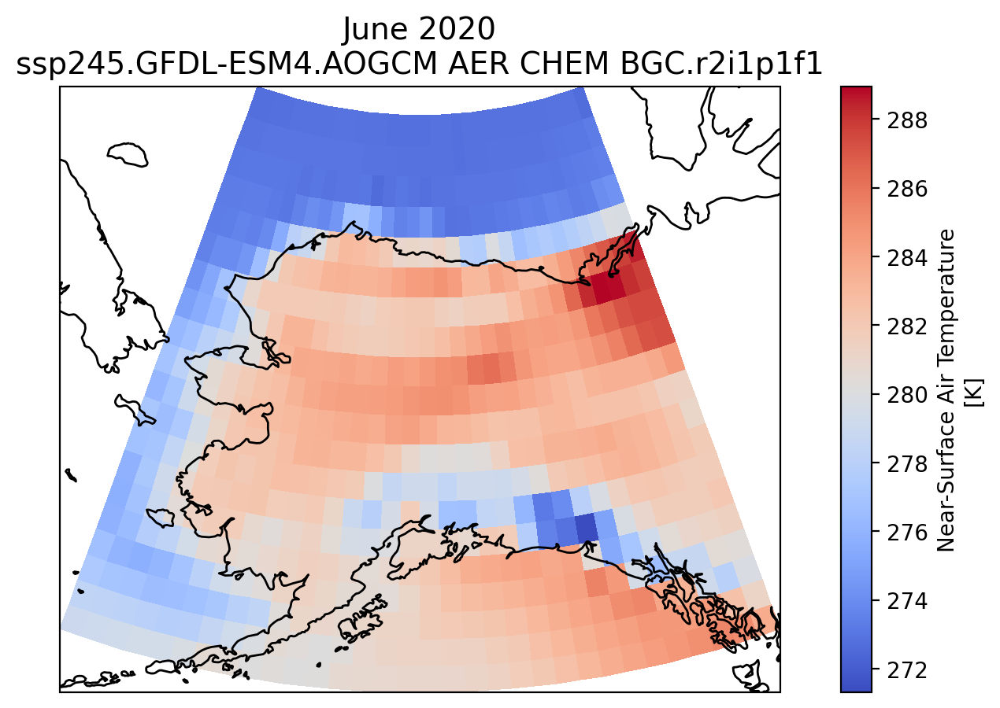

In [27]:
fig = plt.figure(1, figsize=[10,5])

ds_idx = 1

#time_idx = 40
time_str = '2020-06'

# We're using cartopy and are plotting in Orthographic projection 
# (see documentation on cartopy)
ax = plt.subplot(1, 1, 1, projection=ccrs.Orthographic(210, 90))
ax.coastlines()

# We need to project our data to the new Orthographic projection and for this we use `transform`.
# we set the original data projection in transform (here PlateCarree)
#cmip6_dsinterp_listds_idx]['tas'].isel(time=0).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='coolwarm')
cmip6_dsinterp_list[ds_idx]['tas'].sel({'time':time_str}).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='coolwarm')

# One way to customize your title
model_info = ".".join([cmip6_dsinterp_list[ds_idx].attrs[v] for v in ['experiment_id','parent_source_id','source_type','variant_label']])
plt.title(f"{cmip6_dsinterp_list[ds_idx].sel({'time':time_str}).time.values[0].strftime('%B %Y')}\n{model_info}", fontsize=14)

## Ensemble monthly median map

In [43]:
cbar_kwargs = {'orientation':'vertical', 'shrink':1,'label':'Near-Surface Air Temperature\n[K]'}

Text(0.5, 1.0, 'June 2090\n280 model ensemble median')

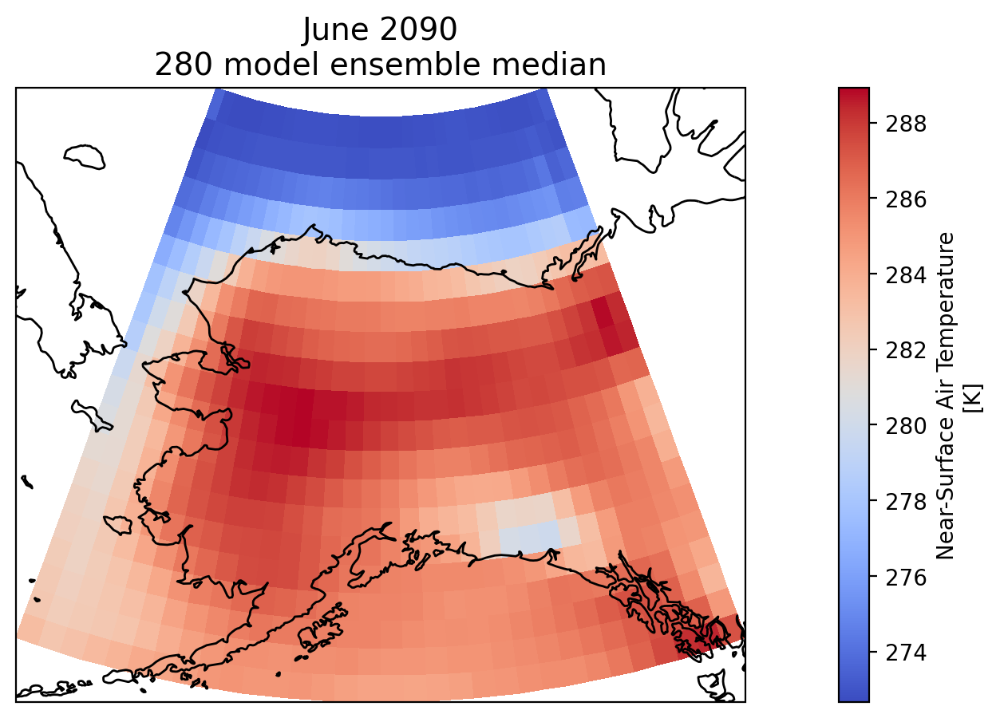

In [55]:
fig = plt.figure(1, figsize=[15,5])

time_idx = 40
time_str = '2090-06'

# We're using cartopy and are plotting in Orthographic projection 
# (see documentation on cartopy)
ax = plt.subplot(1, 1, 1, projection=ccrs.Orthographic(210, 90))
ax.coastlines()

# We need to project our data to the new Orthographic projection and for this we use `transform`.
# we set the original data projection in transform (here PlateCarree)
#ds_combine.median(dim="source_id").tas.isel(time=time_idx).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='coolwarm')
ds_combine.median(dim="source_id").tas.sel({'time':time_str}).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='coolwarm',cbar_kwargs=cbar_kwargs)
if False:
    ds_combine.count(dim="source_id").tas.sel({'time':time_str}).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='coolwarm',cbar_kwargs=cbar_kwargs)

# One way to customize your title
#title_str = ds_combine.time.values[time_idx].strftime('%B %Y')
title_str = ds_combine.sel({'time':time_str}).time.values[0].strftime('%B %Y')
plt.title(f"{title_str}\n{len(cmip6_dsinterp_list)} model ensemble median", fontsize=14)

Text(0.5, 1.0, 'June 2090\n280 model ensemble st dev')

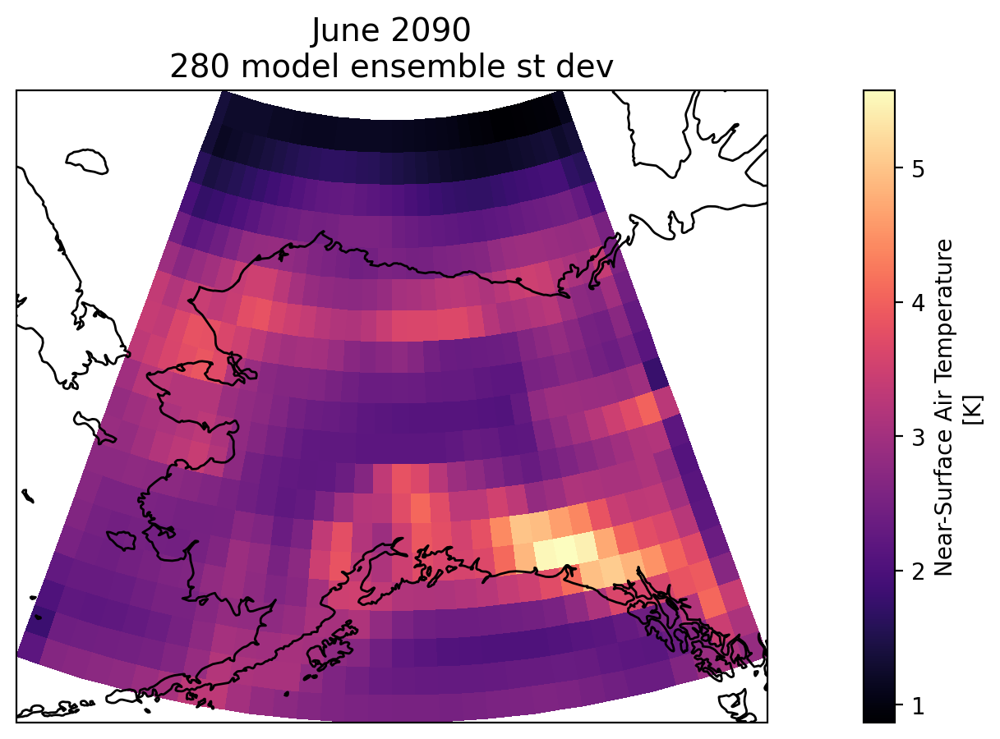

In [45]:
fig = plt.figure(1, figsize=[15,5])

time_idx = 40
time_str = '2090-06'

# We're using cartopy and are plotting in Orthographic projection 
# (see documentation on cartopy)
ax = plt.subplot(1, 1, 1, projection=ccrs.Orthographic(210, 90))
ax.coastlines()

# We need to project our data to the new Orthographic projection and for this we use `transform`.
# we set the original data projection in transform (here PlateCarree)
#ds_combine.median(dim="source_id").tas.isel(time=time_idx).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='coolwarm')
im = ds_combine.std(dim="source_id").tas.sel({'time':time_str}).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='magma', cbar_kwargs = cbar_kwargs)

# One way to customize your title
#title_str = ds_combine.time.values[time_idx].strftime('%B %Y')
title_str = ds_combine.sel({'time':time_str}).time.values[0].strftime('%B %Y')
plt.title(f"{title_str}\n{len(cmip6_dsinterp_list)} model ensemble st dev", fontsize=14)

In [ ]:
# https://comptools.climatematch.io/tutorials/W2D1_FutureClimate-IPCCIPhysicalBasis/student/W2D1_Tutorial2.html
# https://comptools.climatematch.io/tutorials/W2D1_FutureClimate-IPCCIPhysicalBasis/student/W2D1_Tutorial3.html

In [ ]:
#https://nordicesmhub.github.io/forces-2021/learning/example-notebooks/CMIP6_example.html

/opt/conda/envs/pangeo/lib/python3.10/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(
/tmp/ipykernel_170/3865838041.py:9: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax,i in zip(p.axes.flat,  ds_combine.time.sel(time = ds_combine.time.dt.year.isin([2015, 2100])).values):


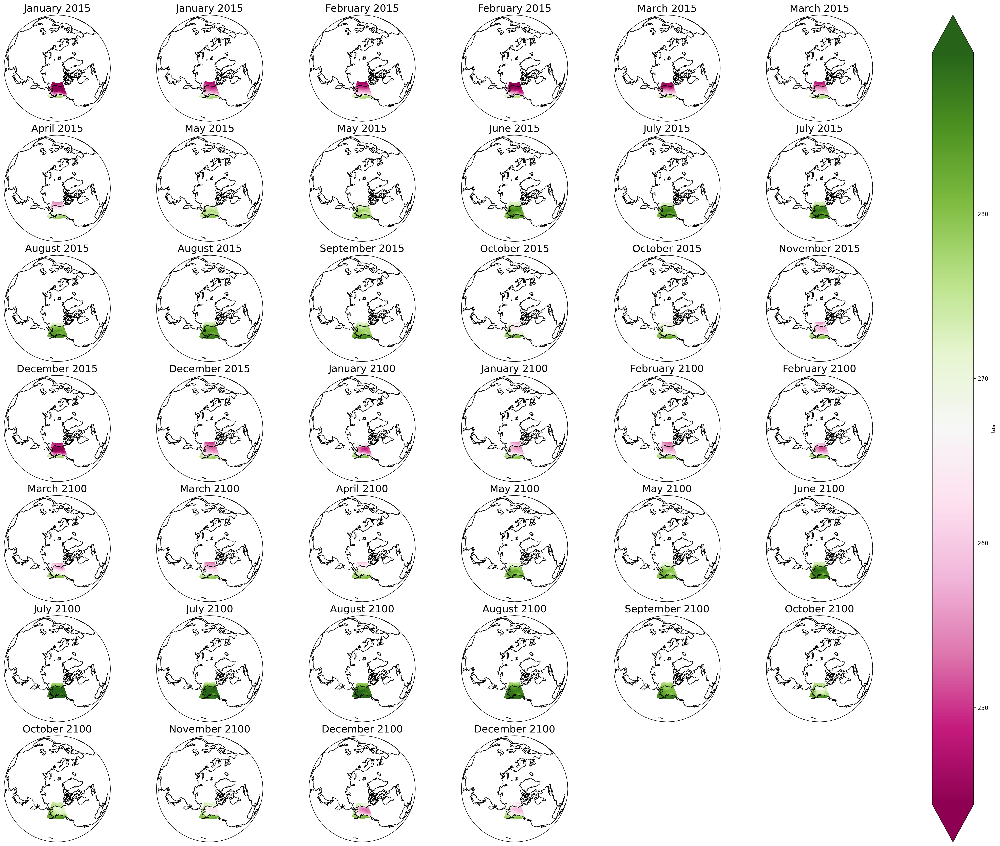

In [53]:
proj_plot = ccrs.Orthographic(210, 90)

p = ds_combine.median(dim="source_id").tas.sel(time = ds_combine.time.dt.year.isin([2015, 2100])).squeeze().plot(x='lon', y='lat', 
                                                                 transform=ccrs.PlateCarree(),
                                                                 aspect=ds_combine.dims["x"] / ds_combine.dims["y"],  # for a sensible figsize
                                                                 subplot_kws={"projection": proj_plot},
                                                                 col='time', col_wrap=6, robust=True, cmap='PiYG')
# We have to set the map's options on all four axes
for ax,i in zip(p.axes.flat,  ds_combine.time.sel(time = ds_combine.time.dt.year.isin([2015, 2100])).values):
    ax.coastlines()
    ax.set_title(i.strftime("%B %Y"), fontsize=18)

# 
#
# Miscellaneous stuff below

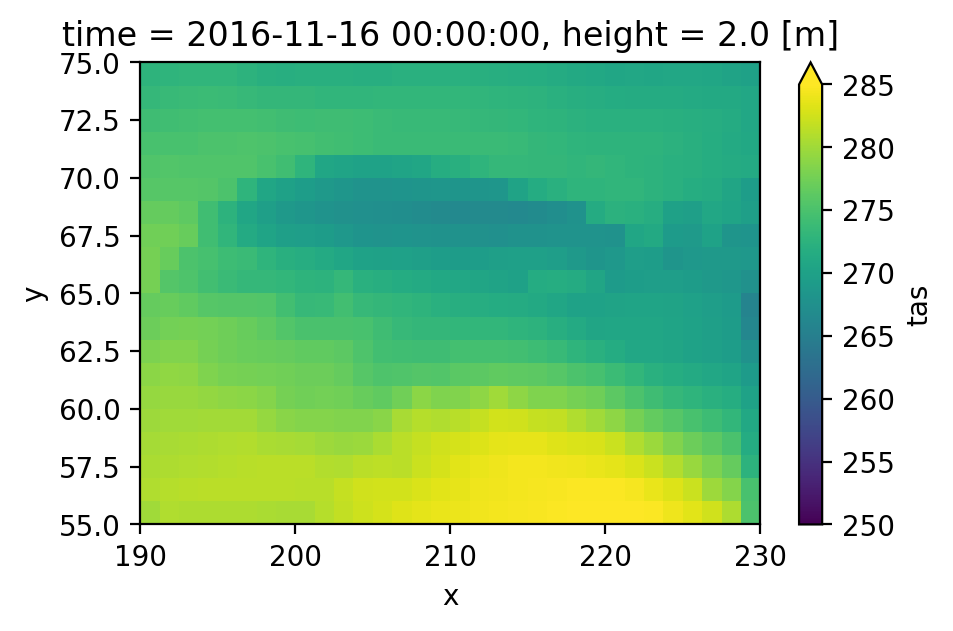

In [544]:
ds_combine.max(dim="source_id").tas.isel(time=50).plot(vmin=250, vmax=285, figsize=(5,3))

In [50]:
#ds_combine.quantile(0.95, dim=('lat','lon')).plot()

#### Bad (b/c must interpolate to a common grid)

In [ ]:
ds_combine = xr.concat(cmip6_ds_list, dim="band",)
ds_ensemble_median = ds_combine.median(dim="band")
ds_ensemble_median[-1].plot(figsize=(5,3))

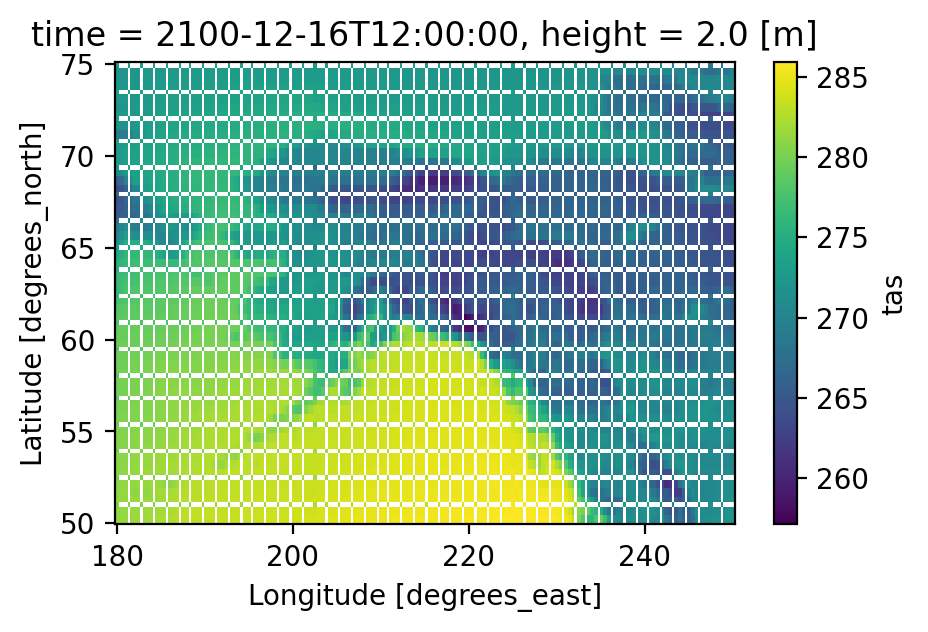

In [613]:
ds_ensemble_median[-1].plot(figsize=(5,3))

# Show full extent for a time and variable

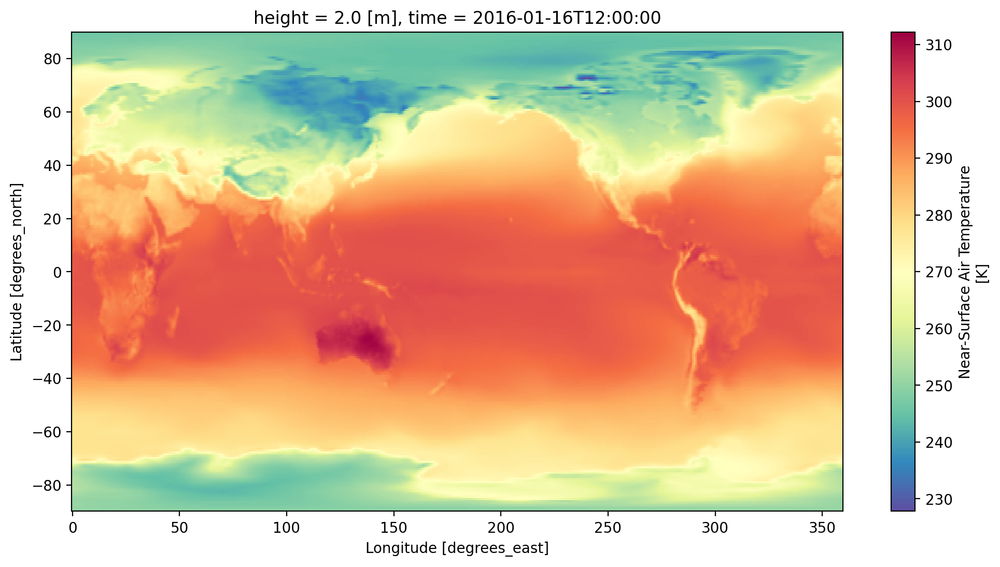

In [189]:
ds.tas.sel({'time':'2016-01'}).plot(cmap='Spectral_r')

## Subset to an extent

https://docs.xarray.dev/en/stable/examples/visualization_gallery.html

In [190]:
min_lon, max_lon, min_lat, max_lat = (180, 250, 50, 75)

mask_lon = (ds.lon >= min_lon) & (ds.lon <= max_lon)
mask_lat = (ds.lat >= min_lat) & (ds.lat <= max_lat)

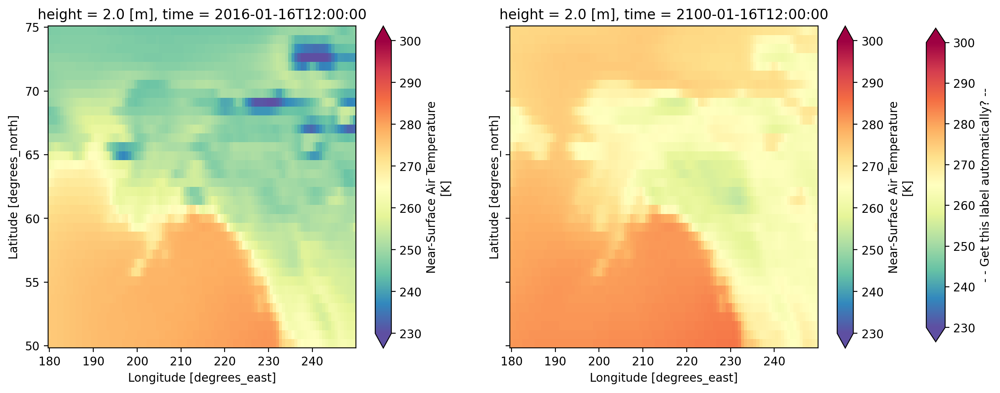

In [243]:
fig, axes = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(15,5))

TIME_LIST = ['2016-01','2100-01']

for i, ax in enumerate(axes):
    im = ds.where(mask_lon & mask_lat, drop=True).tas.sel({'time':TIME_LIST[i]}).plot(ax=ax, cmap='Spectral_r', extend='both', vmin=230, vmax=300, add_colorbar=True)

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.825, 0.125, 0.015, 0.75])
fig.colorbar(im, cax=cbar_ax, extend='both', label='- - Get this label automatically? --')
plt.show()

## Explore subsetting and plotting options

Resources:  
https://kpegion.github.io/AOES-CLIM-WorkingWithData/02-subsetting/index.html

In [317]:
def do_plot_map(ds, map_proj, EXTENT=[min_lon, max_lon, min_lat, max_lat]):
    
    p = ds.plot(
        cmap='RdBu_r',
        transform=ccrs.PlateCarree(),  # the data's projection
        col="time",
        col_wrap=5,  # multiplot settings
       # aspect=ds.dims["lon"] / ds.dims["lat"],  # for a sensible figsize
        subplot_kws={"projection": map_proj},
        cbar_kwargs={"label": "°C"}
    )  # the plot's projection

    # We have to set the map's options on all axes
    for ax in p.axes.flat:
        ax.coastlines()
        ax.set_extent(EXTENT)

In [318]:
def do_plot_timeseries(ds_sub, lon, focal_lat_list, dims, EXTENT=[min_lon, max_lon, min_lat, max_lat]):
    def lon2idx(lon, dims):
        return int(lon * dims[2]/(EXTENT[1]-EXTENT[0]))

    def lat2idx(lat, dim):
        return int(lat * dims[1]/(EXTENT[3]-EXTENT[2]) + dims[1]/2)
    # Prepare the figure
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5), sharey=True)

    # Selected latitude indices
    #isel_lats = [dims[1]-40*2, dims[1]-30*2, dims[1]-20*2]
    isel_lats = [lat2idx(lat, dims) for lat in focal_lat_list]

    # Temperature vs longitude plot - illustrates the "hue" kwarg
    print(f'shape: {ds_sub.shape}')
    print(f'lat idxs: {isel_lats}')
    ds_sub.isel(time=0, lat=isel_lats).plot.line(ax=ax1, hue="lat" )
    ax1.set_ylabel("°C")

    # Temperature vs time plot - illustrates the "x" and "add_legend" kwargs
    ds_sub.isel(lon=lon2idx(lon, dims), lat=isel_lats).plot.line(ax=ax2, x="time", add_legend=False)
    ax2.set_ylabel("")

    # Show
    plt.tight_layout()

In [396]:
def do_all_plots(ds, focal_lon, focal_lat_list, EXTENT=(180, 250, 50, 75)):
    
    year_start_idx = [i for i, y in enumerate(year_range) if year_start == y][0]
    year_end_idx = [i for i, y in enumerate(year_range) if year_end == y][0]

    start_idx = (year_start_idx * month_step + focal_month)-1
    end_idx = (year_end_idx * month_step + focal_month)

    time_positions = list(range(start_idx, end_idx, step))

    min_lon, max_lon, min_lat, max_lat = EXTENT
    # This is the map projection we want to plot *onto*
    map_proj_1 = ccrs.LambertConformal(central_longitude=(min_lon+max_lon)/2, central_latitude=(min_lat+max_lat)/2)
    map_proj_2 = ccrs.LambertConformal(central_longitude=-95, central_latitude=45)

    if False:
        mask_lon = (ds.lon >= min_lon) & (ds.lon <= max_lon)
        mask_lat = (ds.lat >= min_lat) & (ds.lat <= max_lat)
        # subset to spatial extent with selection of a time range
        ds_sub_1 = ds.where(mask_lon & mask_lat, drop=True).tas.isel(time=time_positions) - 273.15
        
        do_plot_map(ds_sub_1, map_proj_1, EXTENT=EXTENT)
        do_plot_map(ds_sub_1, map_proj_2, EXTENT=EXTENT)
        do_plot_timeseries(ds_sub_1, focal_lon, focal_lat_list, dims=ds_sub_1.shape )
    
    # Correct way to crop
    ## CROPPING INTERFERES WITH THE WAY EXTENT IS USED BELOW?
    if False:
        ds = ds.sel(lat=slice(min_lat,max_lat), lon=slice(min_lon,max_lon))

    # subset only with selection of a time range --> this makes for easiest time-series plotting
    ds_sub_2 = ds.tas.isel(time=time_positions) - 273.15
    
    
    do_plot_map(ds_sub_2, map_proj_1, EXTENT=EXTENT)
    do_plot_map(ds_sub_2, map_proj_2, EXTENT=EXTENT) # this one looks the best

    do_plot_timeseries(ds_sub_2, focal_lon, focal_lat_list, dims=ds_sub_2.shape, EXTENT=[0,360-1,0,180-1])



## Set parameters for plotting

In [389]:
# ds_point=ds_sub_2.sel(lat=60,lon=210,method='nearest')

# ds_point.plot()

In [331]:
def lat2idx(lat, dim):
    return int(lat * dim/180 + dim/2)
lat2idx(90, ds.lat.shape[0])

256

In [332]:
# Set time intervals
year_range = list(range(2015,2100+1))
year_start=2020
year_end=2100
focal_month=8
year_step = 10
month_step = 12
step = year_step * month_step

/tmp/ipykernel_478/167876328.py:14: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in p.axes.flat:
/tmp/ipykernel_478/167876328.py:14: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in p.axes.flat:


shape: (9, 256, 512)
lat idxs: [199, 206, 213, 220, 228, 235]


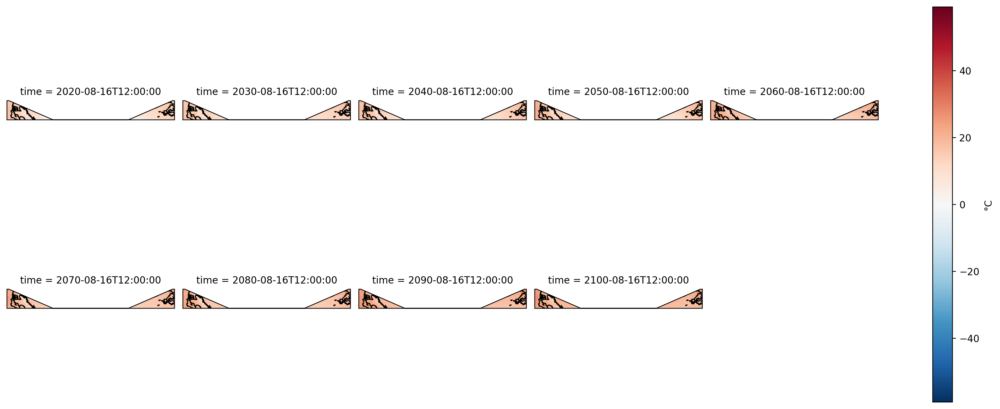

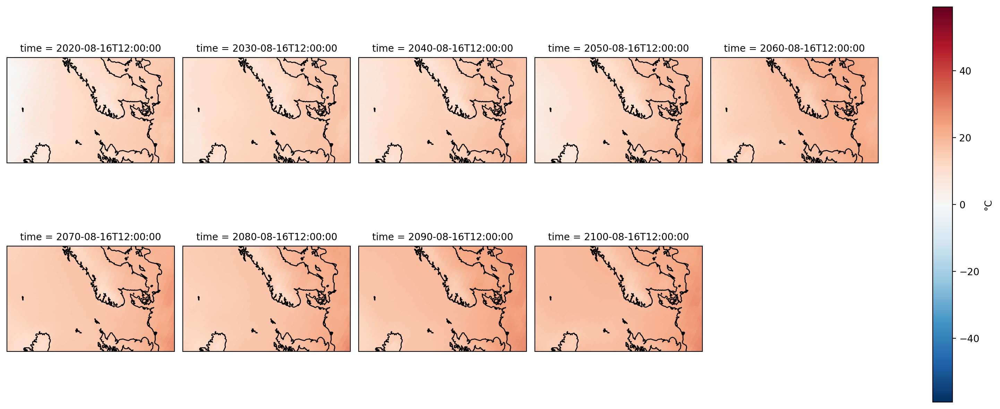

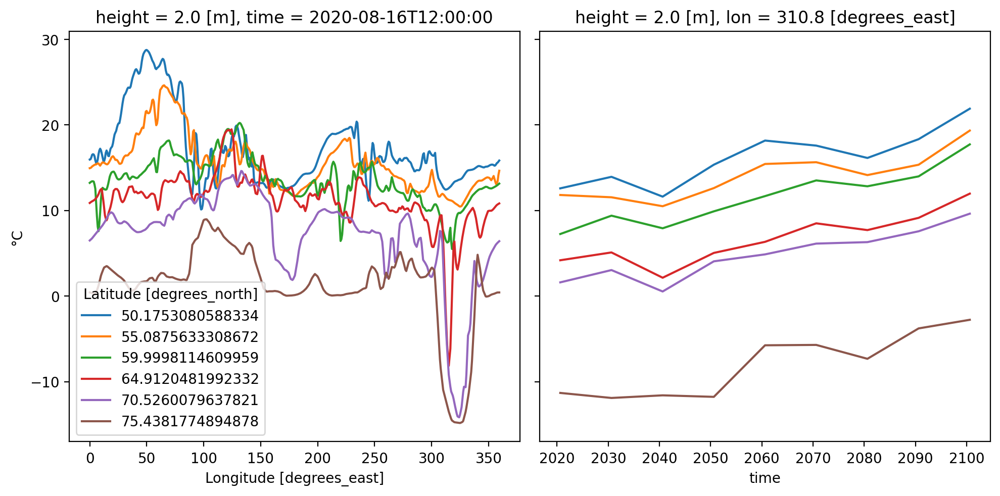

In [399]:
do_all_plots(ds, 310, [50,55,60,65,70,75], EXTENT=(10, 360, 50, 75))

In [197]:
year_start_idx = [i for i, y in enumerate(year_range) if year_start == y][0]
year_end_idx = [i for i, y in enumerate(year_range) if year_end == y][0]

start_idx = (year_start_idx * month_step + focal_month)-1
end_idx = (year_end_idx * month_step + focal_month)

time_positions = list(range(start_idx, end_idx, step))

min_lon, max_lon, min_lat, max_lat = (180, 250, 50, 75)

mask_lon = (ds.lon >= min_lon) & (ds.lon <= max_lon)
mask_lat = (ds.lat >= min_lat) & (ds.lat <= max_lat)

# subset to spatial extent with selection of a time range
ds_sub_1 = ds.where(mask_lon & mask_lat, drop=True).tas.isel(time=time_positions) - 273.15
# subset only with selection of a time range
ds_sub_2 = ds.tas.isel(time=time_positions) - 273.15

# This is the map projection we want to plot *onto*
map_proj_1 = ccrs.LambertConformal(central_longitude=(min_lon+max_lon)/2, central_latitude=(min_lat+max_lat)/2)
map_proj_2 = ccrs.LambertConformal(central_longitude=-95, central_latitude=45)

/tmp/ipykernel_478/3957889549.py:13: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in p.axes.flat:
/tmp/ipykernel_478/3957889549.py:13: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in p.axes.flat:
/tmp/ipykernel_478/3957889549.py:13: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in p.axes.flat:
/tmp/ipykernel_478/3957889549.py:13: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in p.axes.flat:


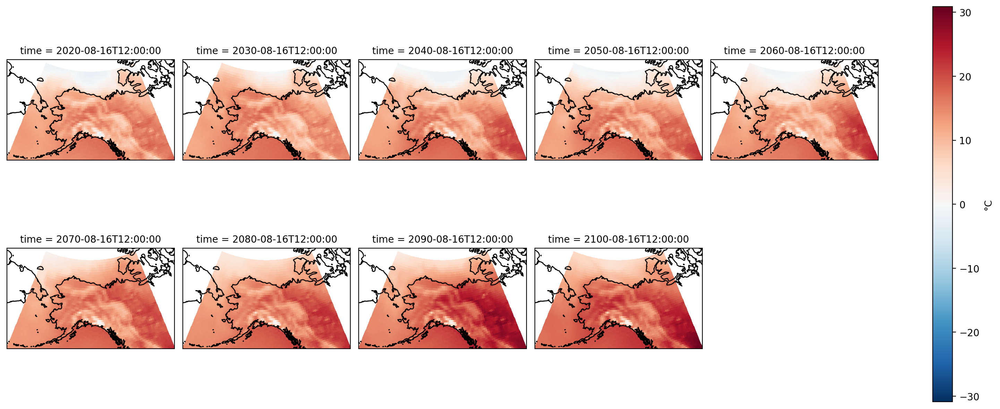

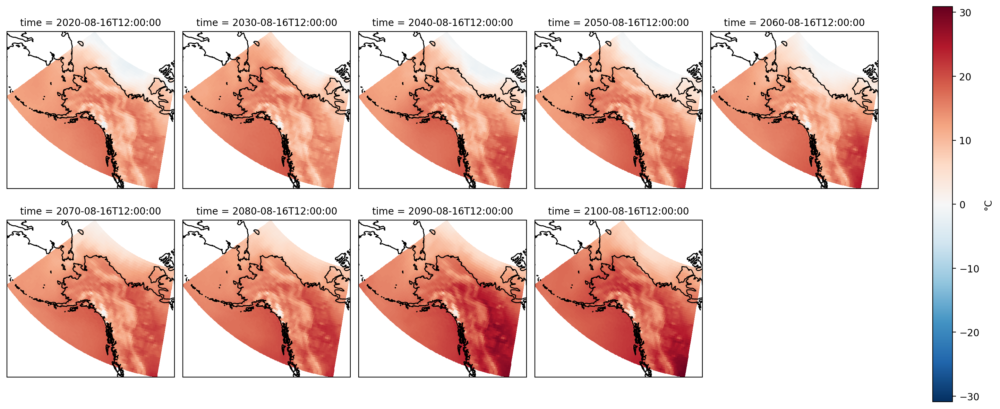

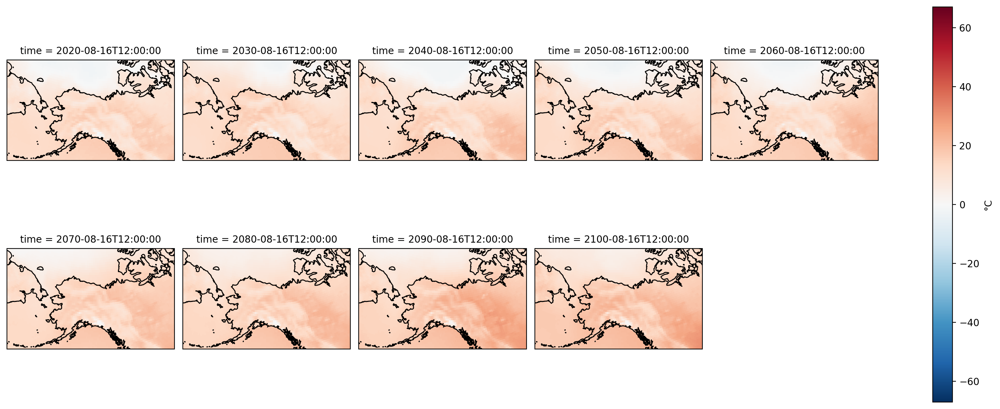

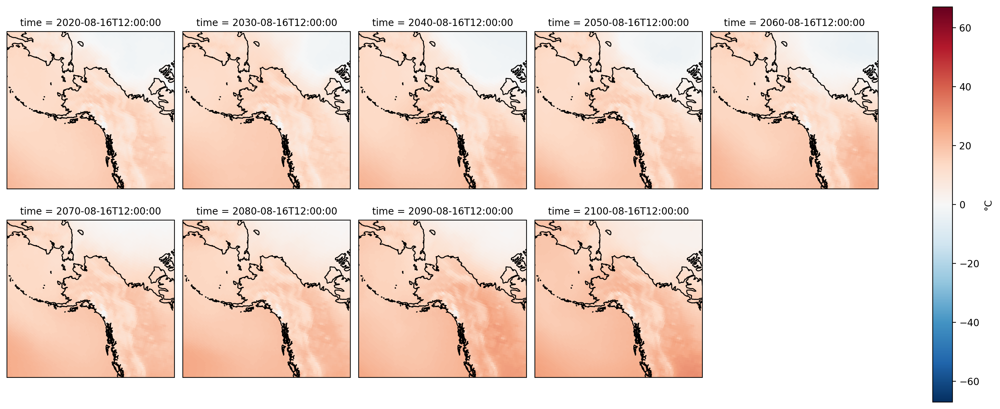

In [181]:
do_plot_map(ds_sub_1, map_proj_1)
do_plot_map(ds_sub_1, map_proj_2)
do_plot_map(ds_sub_2, map_proj_1)
do_plot_map(ds_sub_2, map_proj_2)

In [182]:
ds_sub_1

<xarray.DataArray 'tas' (time: 9, lat: 50, lon: 141)>
dask.array<sub, shape=(9, 50, 141), dtype=float32, chunksize=(1, 50, 141), chunktype=numpy.ndarray>
Coordinates:
    height   float64 2.0
  * lat      (lat) float64 50.18 50.68 51.18 51.68 ... 73.15 73.65 74.15 74.65
  * lon      (lon) float64 180.0 180.5 181.0 181.5 ... 248.5 249.0 249.5 250.0
  * time     (time) datetime64[ns] 2020-08-16T12:00:00 ... 2100-08-16T12:00:00

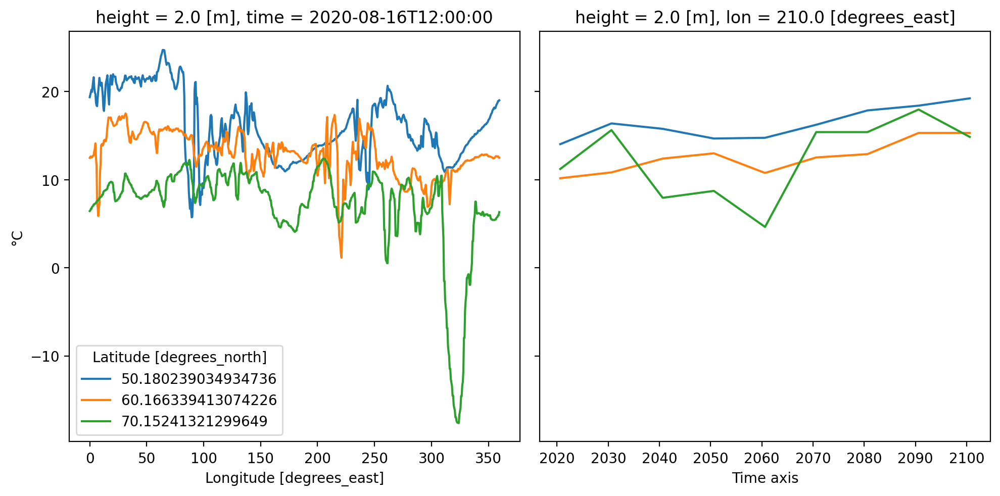

In [184]:
do_plot_timeseries(ds_sub_2, 210, dims=ds_sub_2.shape)